# Problem 1

For this problem, there were a few main focuses when analyzing multilayer perceptrons. The first test was to determine the idean number of hidden units. It would seem that increasing the number of hidden units after a certain point does little to improve the validation accuracy and rather just causes the code to take longer to run. Having at least 10 hidden units seemed to provide adaquet accuracy without sacrificing speed.

The second focus was seeing the impact of adding a second layer. After some testing, adding a second layer slightly improved the network's accuracy while increasing the training time, providing a similar effect to adding more hidden units.

The third forcus was testing different learning rates. The smaller the learning rate, the more epochs are required to reach similar levels of validation accuracy. Thus an ideal learning rate is somewhere inbetween speed while preventing overshoot. In the case of this MLP, after testing the ideal learning rate seemed to be somewhere in the range of 0.05 to 0.1.


I also spend some time trying to implement CUDA to run PyTorch on my GPU rather than my CPU. After many failed attempts, I have determined I need more time and research into the proper implementation before running CUDA will provide any speed benefit.

In [5]:
import torch
from torch import nn
from d2l import torch as d2l

In [6]:
class MLP(d2l.Classifier):
    def __init__(self, num_outputs, num_hiddens, lr):
        super().__init__()
        self.save_hyperparameters()
        self.net = nn.Sequential(nn.Flatten(), nn.LazyLinear(num_hiddens),
                                 nn.ReLU(), nn.LazyLinear(num_outputs))

In [16]:
data = d2l.FashionMNIST(batch_size=256)
trainer = d2l.Trainer(max_epochs=10)

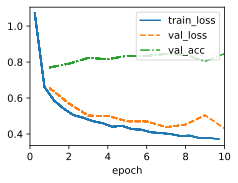

In [17]:
model = MLP(num_outputs=10, num_hiddens=256, lr=0.1)
trainer.fit(model, data)

##### Test Different num_hiddens

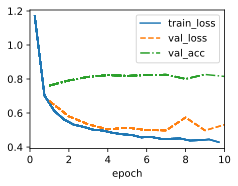

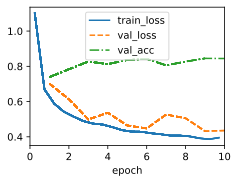

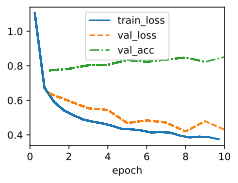

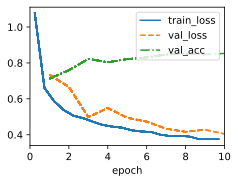

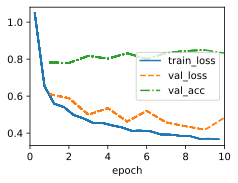

In [8]:
nums_hiddens = [10,50,100,200,500]
for ix in nums_hiddens:
    model = MLP(num_outputs=10, num_hiddens=ix, lr=0.1)
    trainer.fit(model, data)

##### CUDA tests

In [14]:
import torch
from torch.utils.data import DataLoader

nums_hiddens = [10, 50, 100, 200, 500]

# Check if CUDA is available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
data = d2l.FashionMNIST(batch_size=256)

# Move data to CUDA device
device = torch.device("cuda")

# Move data loading onto GPU using DataLoader
device = torch.device("cuda")
data_loader = DataLoader(data, batch_size=None, pin_memory=True)

for X, y in data_loader:
    X = X.to(device)
    y = y.to(device)
    # Your training/validation loop here


# Assuming MLP is a custom model class
for ix in nums_hiddens:
    # Create model instance
    model = MLP(num_outputs=10, num_hiddens=ix, lr=0.1)
    
    # Move model to GPU
    model.to("cuda")

    
    # Assuming trainer is an instance of a custom training class
    trainer.fit(model, data)

TypeError: object of type 'FashionMNIST' has no len()

In [15]:
import torch
print(torch.cuda.is_available())


True


##### Add Hidden Layer

In [18]:
import torch
from torch import nn
from d2l import torch as d2l

In [19]:
class MLP(d2l.Classifier):
    def __init__(self, num_outputs, num_hiddens, lr):
        super().__init__()
        self.save_hyperparameters()
        self.net = nn.Sequential(nn.Flatten(), nn.LazyLinear(num_hiddens[0]),
                                 nn.ReLU(), nn.LazyLinear(num_hiddens[1]),
                                 nn.ReLU(), nn.LazyLinear(num_outputs))

In [20]:
data = d2l.FashionMNIST(batch_size=256)
trainer = d2l.Trainer(max_epochs=10)

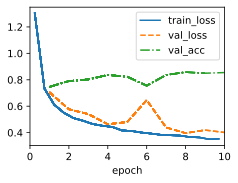

In [22]:
model = MLP(num_outputs=10, num_hiddens=[256,128], lr=0.1)
trainer.fit(model, data)

##### Change Learning Rate

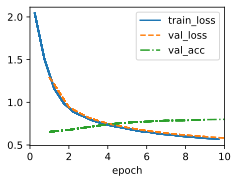

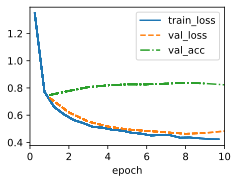

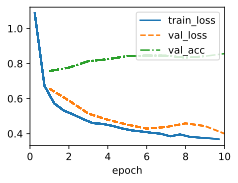

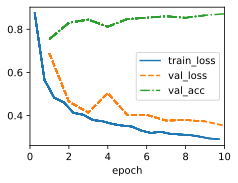

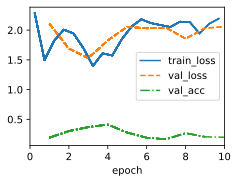

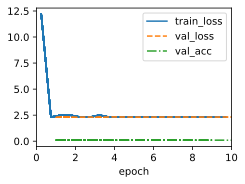

In [23]:
import torch
from torch import nn
from d2l import torch as d2l
class MLP(d2l.Classifier):
    def __init__(self, num_outputs, num_hiddens, lr):
        super().__init__()
        self.save_hyperparameters()
        self.net = nn.Sequential(nn.Flatten(), nn.LazyLinear(num_hiddens),
                                 nn.ReLU(), nn.LazyLinear(num_outputs))
data = d2l.FashionMNIST(batch_size=256)
trainer = d2l.Trainer(max_epochs=10)
lrs = [0.01,0.05,0.1,0.5,1,5]
for lr in lrs:
    model = MLP(num_outputs=10, num_hiddens=256, lr=lr)
    trainer.fit(model, data)

## Problem 2

For this problem I was testing the effectiveness of the dropout method. After some more CUDA testing I tested the effects of changing the droupout probabilities. In general I found that the higher the dropout probability, the greater the variation in the training and calidation losses across epochs. The system when both probabilities were set small had little to no variation between the training and validation loss. However, that lack of variation produced the weakest validation accuracy. This makes sense if the system is over-fitting to the training data. When using a higher probability, you decrease the effects of over fitting.

When testing the activations the variation in the hidden layers appears to remain relatively constant across all of the iterations. Interstingly, the dropout layers seemed to have the greatest variation besides the initial lazy linear function. This makes sense to me as the dropout layers vary randomly due to a probability set in the hyper parameters.

When comparing the effects of weight decay and dropout, they seem to both be effective in improving the validation loss of the network. Further, they are not mutually exclusive and when combined the properties of both are additive, producing an even more accurate result.



In [19]:
import torch
from torch import nn
from d2l import torch as d2l

In [20]:
class DropoutMLP(d2l.Classifier):
    def __init__(self, num_outputs, num_hiddens_1, num_hiddens_2,
                 dropout_1, dropout_2, lr):
        super().__init__()
        self.save_hyperparameters()
        self.net = nn.Sequential(
            nn.Flatten(), nn.LazyLinear(num_hiddens_1), nn.ReLU(),
            nn.Dropout(dropout_1), nn.LazyLinear(num_hiddens_2), nn.ReLU(),
            nn.Dropout(dropout_2), nn.LazyLinear(num_outputs))

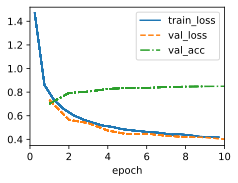

In [30]:
hparams = {'num_outputs':10, 'num_hiddens_1':256, 'num_hiddens_2':256,
           'dropout_1':0.5, 'dropout_2':0.5, 'lr':0.1}
model = DropoutMLP(**hparams)
data = d2l.FashionMNIST(batch_size=256)
trainer = d2l.Trainer(max_epochs=10)
trainer.fit(model, data)

In [21]:
import torch
from torchvision import datasets, transforms

hparams = {'num_outputs':10, 'num_hiddens_1':256, 'num_hiddens_2':256,
           'dropout_1':0.5, 'dropout_2':0.5, 'lr':0.1}
model = DropoutMLP(**hparams)
model = model.to("cuda")
data = d2l.FashionMNIST(batch_size=1000)

# Define a transform to normalize the data
transform = transforms.Compose([transforms.ToTensor(),
                                transforms.Normalize((0.5,), (0.5,))])

# Load the FashionMNIST training and test datasets
train_data = datasets.FashionMNIST('~/.pytorch/F_MNIST_data/', train=True, download=True, transform=transform)
test_data = datasets.FashionMNIST('~/.pytorch/F_MNIST_data/', train=False, download=True, transform=transform)

train_loader = torch.utils.data.DataLoader(train_data, batch_size=1000, shuffle=True)
test_loader = torch.utils.data.DataLoader(test_data, batch_size=1000, shuffle=True)


print(data)
#trainer = d2l.Trainer(max_epochs=10)

c:\Users\aidan\PythonEnvironment\AI\lib\site-packages\torch\nn\modules\lazy.py:181: UserWarning: Lazy modules are a new feature under heavy development so changes to the API or functionality can happen at any moment.
  warnings.warn('Lazy modules are a new feature under heavy development '


In [22]:
batch_size = 1000

def move_to_device(data):
    if isinstance(data, (list, tuple)):
        return [move_to_device(d) for d in data]
    return data.to("cuda")

# Move each batch to GPU
for i, (inputs, targets) in enumerate(train_loader):
    train_loader.dataset.data[i * batch_size : (i + 1) * batch_size] = move_to_device(inputs).squeeze()
    train_loader.dataset.targets[i * batch_size : (i + 1) * batch_size] = move_to_device(targets)

for i, (inputs, targets) in enumerate(test_loader):
    test_loader.dataset.data[i * batch_size : (i + 1) * batch_size] = move_to_device(inputs).squeeze()
    test_loader.dataset.targets[i * batch_size : (i + 1) * batch_size] = move_to_device(targets)

In [23]:
import gc

print("Tensors on GPU:")
for obj in gc.get_objects():
    if torch.is_tensor(obj):
        print(obj.device)

Tensors on GPU:
cpu
cpu
cuda:0
cuda:0
cuda:0
cuda:0
cuda:0
cuda:0
cpu
cpu
cpu
cuda:0
cuda:0
cuda:0
cuda:0
cuda:0
cuda:0
cuda:0
cuda:0
cuda:0
cuda:0
cuda:0
cpu
cpu
cpu
cpu
cpu
cpu
cpu
cpu
cpu
cpu
cpu
cpu
cuda:0
cuda:0
cuda:0
cuda:0
cuda:0
cuda:0


In [24]:
import torch.optim as optim

# Define loss function and optimizer
criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr=hparams['lr'])

# Train the model
for epoch in range(10):
    running_loss = 0.0
    correct = 0
    total = 0
    model.train()
    for i, data in enumerate(train_loader, 0):
        inputs, labels = data
        inputs, labels = inputs.to("cuda"), labels.to("cuda")
        
        optimizer.zero_grad()
        
        outputs = model(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

    print('Epoch %d, Loss: %.3f, Accuracy: %.3f' %
          (epoch + 1, running_loss / len(train_loader), 100 * correct / total))

print('Finished Training')


Epoch 1, Loss: 1.790, Accuracy: 34.412
Epoch 2, Loss: 1.242, Accuracy: 52.168
Epoch 3, Loss: 1.084, Accuracy: 57.997
Epoch 4, Loss: 0.995, Accuracy: 61.725
Epoch 5, Loss: 0.938, Accuracy: 64.212
Epoch 6, Loss: 0.894, Accuracy: 66.177
Epoch 7, Loss: 0.861, Accuracy: 67.458
Epoch 8, Loss: 0.833, Accuracy: 68.747
Epoch 9, Loss: 0.812, Accuracy: 69.962
Epoch 10, Loss: 0.792, Accuracy: 70.587
Finished Training


##### Change Probabilities

In [ ]:
import torch
from torch import nn
from d2l import torch as d2l
class DropoutMLP(d2l.Classifier):
    def __init__(self, num_outputs, num_hiddens_1, num_hiddens_2,
                 dropout_1, dropout_2, lr):
        super().__init__()
        self.save_hyperparameters()
        self.net = nn.Sequential(
            nn.Flatten(), nn.LazyLinear(num_hiddens_1), nn.ReLU(),
            nn.Dropout(dropout_1), nn.LazyLinear(num_hiddens_2), nn.ReLU(),
            nn.Dropout(dropout_2), nn.LazyLinear(num_outputs))

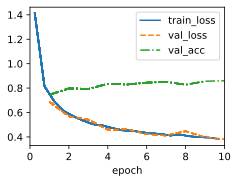

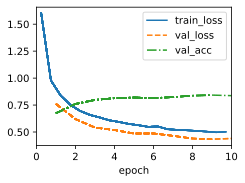

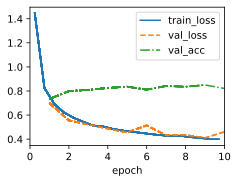

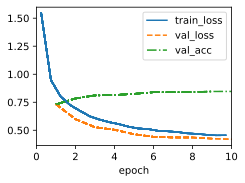

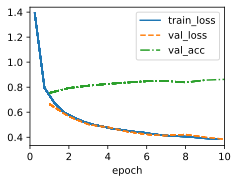

In [27]:
probabilities = [[0.25,0.75,0.5,0.5,0.3],[0.5,0.5,0.25,0.75,0.4]]
for n, m in zip(*probabilities):
    hparams = {'num_outputs':10, 'num_hiddens_1':256, 'num_hiddens_2':256,
            'dropout_1':n, 'dropout_2':m, 'lr':0.1}
    model = DropoutMLP(**hparams)
    data = d2l.FashionMNIST(batch_size=256)
    trainer = d2l.Trainer(max_epochs=10)
    trainer.fit(model, data)

In [33]:
print(probabilities)

[[0.25, 0.75, 0.5, 0.5, 0.3], [0.5, 0.5, 0.25, 0.75, 0.4]]


##### Determine Variance in Activations

In [2]:
import torch
from torch import nn
from d2l import torch as d2l
class DropoutMLP(d2l.Classifier):
    def __init__(self, num_outputs, num_hiddens_1, num_hiddens_2,
                 dropout_1, dropout_2, lr):
        super().__init__()
        self.save_hyperparameters()
        self.net = nn.Sequential(
            nn.Flatten(), nn.LazyLinear(num_hiddens_1), nn.ReLU(),
            nn.Dropout(dropout_1), nn.LazyLinear(num_hiddens_2), nn.ReLU(),
            nn.Dropout(dropout_2), nn.LazyLinear(num_outputs))
hparams = {'num_outputs':10, 'num_hiddens_1':256, 'num_hiddens_2':256,
           'dropout_1':0.5, 'dropout_2':0.5, 'lr':0.1}
model = DropoutMLP(**hparams)
data = d2l.FashionMNIST(batch_size=256)
trainer = d2l.Trainer(max_epochs=10)


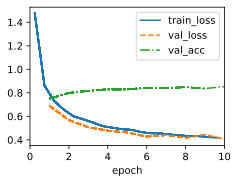

In [3]:
import torch
import torch.nn.functional as F
import matplotlib.pyplot as plt

class VarianceTracker:
    def __init__(self, model):
        self.model = model
        self.variances = {i: [] for i in range(len(model.net)) if isinstance(model.net[i], torch.nn.LazyLinear)}

    def track_variances(self, data_loader):
        self.model.eval()
        with torch.no_grad():
            for X, _ in data_loader:
                X = X.to(next(self.model.parameters()).device)
                activations = X
                for i, layer in enumerate(self.model.net):
                    activations = layer(activations)
                    if isinstance(layer, torch.nn.LazyLinear):
                        self.variances[i].append(activations.var(dim=0).mean().item())

def plot_variances(variances_dropout, variances_no_dropout, xlabel, ylabel, legend):
    plt.figure(figsize=(10, 6))
    for i, var_dropout in enumerate(variances_dropout.values()):
        plt.plot(var_dropout, label=f'With Dropout - Layer {i+1}')
    for i, var_no_dropout in enumerate(variances_no_dropout.values()):
        plt.plot(var_no_dropout, linestyle='--', label=f'Without Dropout - Layer {i+1}')
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.legend(legend)
    plt.title('Evolution of Activation Variances')
    plt.show()

# Create models with and without dropout
model_dropout = DropoutMLP(**hparams)
model_no_dropout = DropoutMLP(**hparams)

# Create data loaders
data = d2l.FashionMNIST(batch_size=256)
train_loader = data.train_dataloader()

# Create variance trackers
tracker_dropout = VarianceTracker(model_dropout)
tracker_no_dropout = VarianceTracker(model_no_dropout)

# Train models and track variances
for epoch in range(10):
    print(f"Epoch {epoch+1}")
    tracker_dropout.track_variances(train_loader)
    tracker_no_dropout.track_variances(train_loader)
    trainer.fit(model_dropout, data)
    trainer.fit(model_no_dropout, data)



Epoch [1/10], Variance of Activations: [[0.10450516641139984, 0.10612887889146805, 0.1104358434677124, 0.109063521027565, 0.10829566419124603, 0.11210335046052933, 0.10788022726774216, 0.10819558054208755, 0.10983524471521378, 0.10712486505508423, 0.11003638058900833, 0.1151016354560852, 0.10445781797170639, 0.10786715149879456, 0.10947580635547638, 0.10722081363201141, 0.11225729435682297, 0.10556559264659882, 0.10408642143011093, 0.10970338433980942, 0.10919833183288574, 0.11036621034145355, 0.10924877971410751, 0.10582000762224197, 0.10864923894405365, 0.1081928238272667, 0.11243586242198944, 0.10998953878879547, 0.1099960207939148, 0.10843144357204437, 0.1096784919500351, 0.1068526953458786, 0.11162746697664261, 0.10806254297494888, 0.10971088707447052, 0.10710839927196503, 0.10831473767757416, 0.10923299193382263, 0.10521063208580017, 0.10914863646030426, 0.10954667627811432, 0.10945174098014832, 0.10799051076173782, 0.10929909348487854, 0.09905349463224411, 0.10747337341308594, 0

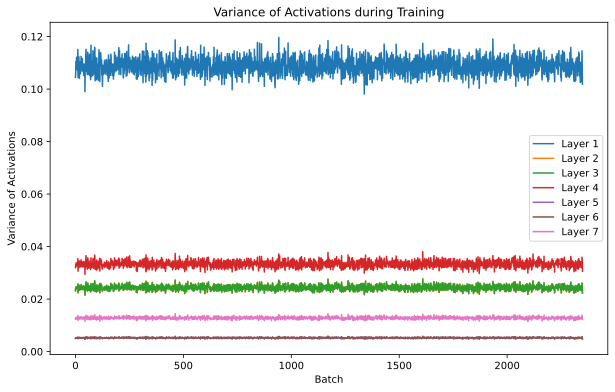

In [33]:
import torch
from torch import nn
from d2l import torch as d2l

class DropoutMLP(d2l.Classifier):
    def __init__(self, num_outputs, num_hiddens_1, num_hiddens_2,
                 dropout_1, dropout_2, lr):
        super().__init__()
        self.save_hyperparameters()
        self.net = nn.Sequential(
            nn.Flatten(), nn.LazyLinear(num_hiddens_1), nn.ReLU(),
            nn.Dropout(dropout_1), nn.LazyLinear(num_hiddens_2), nn.ReLU(),
            nn.Dropout(dropout_2), nn.LazyLinear(num_outputs))

hparams = {'num_outputs':10, 'num_hiddens_1':256, 'num_hiddens_2':256, 'dropout_1':0.2, 'dropout_2':0.5, 'lr':0.1}
model = DropoutMLP(**hparams)
data = d2l.FashionMNIST(batch_size=256)
trainer = d2l.Trainer(max_epochs=10)

# Initialize list to store variance of activations for each layer
variances = [[] for _ in range(7)]  # Seven layers excluding the output layer

# Training loop
for epoch in range(trainer.max_epochs):
    for batch in data.train_dataloader():
        # Forward pass to compute activations
        activations = []
        x, _ = batch
        for layer in model.net[:-1]:  # Exclude the last layer (output layer)
            x = torch.relu(layer(x))
            activations.append(x)

        # Compute variance of activations
        for i, activation in enumerate(activations):
            variance = activation.var(dim=1).mean().item()
            variances[i].append(variance)
    
    # Print progress
    print(f"Epoch [{epoch+1}/{trainer.max_epochs}], Variance of Activations: {variances}")

# Plotting the variance of activations over epochs
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
for i in range(len(variances)):
    plt.plot(range(len(variances[i])), variances[i], label=f'Layer {i+1}')
plt.xlabel('Batch')
plt.ylabel('Variance of Activations')
plt.title('Variance of Activations during Training')
plt.legend()
plt.show()



Epoch [1/10], Variance of Activations: [[0.10565949976444244, 0.10286668688058853, 0.10824257880449295, 0.11298999190330505, 0.1113375797867775, 0.10467440634965897, 0.1066015288233757, 0.11202573776245117, 0.10585010051727295, 0.11131646484136581, 0.10829158872365952, 0.10499793291091919, 0.10465001314878464, 0.10921493172645569, 0.10896632820367813, 0.10304822772741318, 0.108278788626194, 0.11326199769973755, 0.11340285837650299, 0.10812779515981674, 0.10618466138839722, 0.09819719195365906, 0.1113678365945816, 0.10620557516813278, 0.11470859497785568, 0.1093592494726181, 0.1077132597565651, 0.10945811867713928, 0.10519608855247498, 0.10916268080472946, 0.108700230717659, 0.10826100409030914, 0.10846668481826782, 0.10492853820323944, 0.10634106397628784, 0.10851570963859558, 0.11016088724136353, 0.11113031208515167, 0.1159692257642746, 0.10492915660142899, 0.1105332151055336, 0.10703887790441513, 0.10957857966423035, 0.10564436763525009, 0.11257171630859375, 0.10836532711982727, 0.10

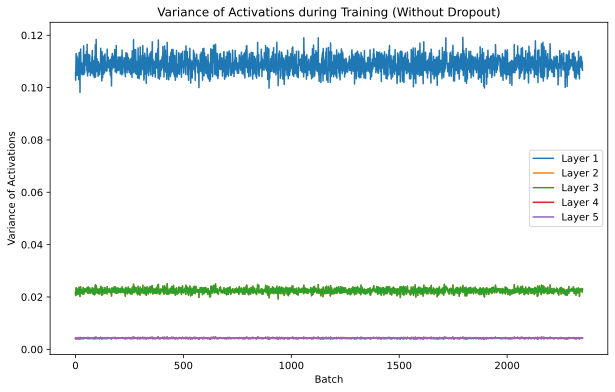

In [34]:
import torch
from torch import nn
from d2l import torch as d2l

class MLP(d2l.Classifier):
    def __init__(self, num_outputs, num_hiddens_1, num_hiddens_2, lr):
        super().__init__()
        self.save_hyperparameters()
        self.net = nn.Sequential(
            nn.Flatten(), nn.LazyLinear(num_hiddens_1), nn.ReLU(),
            nn.LazyLinear(num_hiddens_2), nn.ReLU(),
            nn.LazyLinear(num_outputs))

hparams = {'num_outputs':10, 'num_hiddens_1':256, 'num_hiddens_2':256, 'lr':0.1}
model = MLP(**hparams)
data = d2l.FashionMNIST(batch_size=256)
trainer = d2l.Trainer(max_epochs=10)

# Initialize list to store variance of activations for each layer
variances = [[] for _ in range(5)]  # Five layers excluding the output layer

# Training loop
for epoch in range(trainer.max_epochs):
    for batch in data.train_dataloader():
        # Forward pass to compute activations
        activations = []
        x, _ = batch
        for layer in model.net[:-1]:  # Exclude the last layer (output layer)
            x = torch.relu(layer(x))
            activations.append(x)

        # Compute variance of activations
        for i, activation in enumerate(activations):
            variance = activation.var(dim=1).mean().item()
            variances[i].append(variance)
    
    # Print progress
    print(f"Epoch [{epoch+1}/{trainer.max_epochs}], Variance of Activations: {variances}")

# Plotting the variance of activations over epochs
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
for i in range(len(variances)):
    plt.plot(range(len(variances[i])), variances[i], label=f'Layer {i+1}')
plt.xlabel('Batch')
plt.ylabel('Variance of Activations')
plt.title('Variance of Activations during Training (Without Dropout)')
plt.legend()
plt.show()


##### Weight Decay

Epoch [1/10], Train Loss: 1.0015, Train Acc: 0.6546, Val Loss: 0.6571, Val Acc: 0.7431
Epoch [2/10], Train Loss: 0.5736, Train Acc: 0.7938, Val Loss: 0.5824, Val Acc: 0.7924
Epoch [3/10], Train Loss: 0.4999, Train Acc: 0.8227, Val Loss: 0.4898, Val Acc: 0.8235
Epoch [4/10], Train Loss: 0.4572, Train Acc: 0.8368, Val Loss: 0.5113, Val Acc: 0.8108
Epoch [5/10], Train Loss: 0.4273, Train Acc: 0.8479, Val Loss: 0.4558, Val Acc: 0.8350
Epoch [6/10], Train Loss: 0.4042, Train Acc: 0.8552, Val Loss: 0.4302, Val Acc: 0.8459
Epoch [7/10], Train Loss: 0.3875, Train Acc: 0.8605, Val Loss: 0.4978, Val Acc: 0.8115
Epoch [8/10], Train Loss: 0.3726, Train Acc: 0.8658, Val Loss: 0.4199, Val Acc: 0.8425
Epoch [9/10], Train Loss: 0.3605, Train Acc: 0.8693, Val Loss: 0.5035, Val Acc: 0.7984
Epoch [10/10], Train Loss: 0.3498, Train Acc: 0.8728, Val Loss: 0.3947, Val Acc: 0.8540
Epoch [1/10], Train Loss: 1.0807, Train Acc: 0.6169, Val Loss: 0.6880, Val Acc: 0.7379
Epoch [2/10], Train Loss: 0.6390, Train Ac

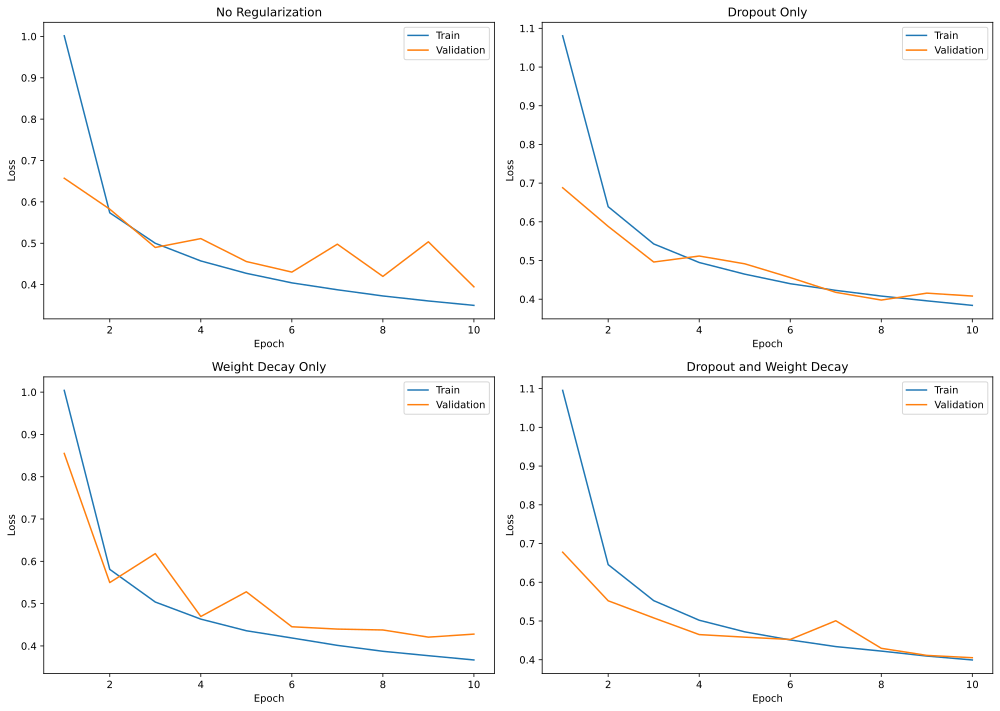

In [35]:
import torch
import torch.nn as nn
from d2l import torch as d2l

# Define the model with dropout
class DropoutMLP(d2l.Classifier):
    def __init__(self, num_outputs, num_hiddens_1, num_hiddens_2,
                 dropout_1, dropout_2, lr):
        super().__init__()
        self.save_hyperparameters()
        self.net = nn.Sequential(
            nn.Flatten(), nn.LazyLinear(num_hiddens_1), nn.ReLU(),
            nn.Dropout(dropout_1), nn.LazyLinear(num_hiddens_2), nn.ReLU(),
            nn.Dropout(dropout_2), nn.LazyLinear(num_outputs))

# Define function to train the model
def train_model(model, data_loader, criterion, optimizer, device):
    model.train()
    epoch_loss = 0
    correct = 0
    total = 0
    for X, y in data_loader:
        X, y = X.to(device), y.to(device)
        optimizer.zero_grad()
        outputs = model(X)
        loss = criterion(outputs, y)
        loss.backward()
        optimizer.step()
        epoch_loss += loss.item()
        _, predicted = torch.max(outputs, 1)
        total += y.size(0)
        correct += (predicted == y).sum().item()
    return epoch_loss / len(data_loader), correct / total

# Function to evaluate the model
def evaluate_model(model, data_loader, criterion, device):
    model.eval()
    epoch_loss = 0
    correct = 0
    total = 0
    with torch.no_grad():
        for X, y in data_loader:
            X, y = X.to(device), y.to(device)
            outputs = model(X)
            loss = criterion(outputs, y)
            epoch_loss += loss.item()
            _, predicted = torch.max(outputs, 1)
            total += y.size(0)
            correct += (predicted == y).sum().item()
    return epoch_loss / len(data_loader), correct / total

# Function to train the model with different configurations
def train_with_configurations(configurations):
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    data = d2l.FashionMNIST(batch_size=256)
    model = DropoutMLP(**configurations['model'])
    model.to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = torch.optim.SGD(model.parameters(), lr=configurations['lr'], weight_decay=configurations['weight_decay'])

    train_losses = []
    train_accuracies = []
    val_losses = []
    val_accuracies = []

    for epoch in range(configurations['num_epochs']):
        train_loss, train_accuracy = train_model(model, data.train_dataloader(), criterion, optimizer, device)
        val_loss, val_accuracy = evaluate_model(model, data.val_dataloader(), criterion, device)
        train_losses.append(train_loss)
        train_accuracies.append(train_accuracy)
        val_losses.append(val_loss)
        val_accuracies.append(val_accuracy)
        print(f"Epoch [{epoch+1}/{configurations['num_epochs']}], "
              f"Train Loss: {train_loss:.4f}, Train Acc: {train_accuracy:.4f}, "
              f"Val Loss: {val_loss:.4f}, Val Acc: {val_accuracy:.4f}")

    return train_losses, train_accuracies, val_losses, val_accuracies

# Define configurations for each experiment
configurations_no_regularization = {
    'model': {'num_outputs': 10, 'num_hiddens_1': 256, 'num_hiddens_2': 256, 'dropout_1': 0.0, 'dropout_2': 0.0, 'lr': 0.1},
    'lr': 0.1,
    'weight_decay': 0.0,
    'num_epochs': 10
}

configurations_dropout_only = {
    'model': {'num_outputs': 10, 'num_hiddens_1': 256, 'num_hiddens_2': 256, 'dropout_1': 0.2, 'dropout_2': 0.5, 'lr': 0.1},
    'lr': 0.1,
    'weight_decay': 0.0,
    'num_epochs': 10
}

configurations_weight_decay_only = {
    'model': {'num_outputs': 10, 'num_hiddens_1': 256, 'num_hiddens_2': 256, 'dropout_1': 0.0, 'dropout_2': 0.0, 'lr': 0.1},
    'lr': 0.1,
    'weight_decay': 0.001,
    'num_epochs': 10
}

configurations_dropout_and_weight_decay = {
    'model': {'num_outputs': 10, 'num_hiddens_1': 256, 'num_hiddens_2': 256, 'dropout_1': 0.2, 'dropout_2': 0.5, 'lr': 0.1},
    'lr': 0.1,
    'weight_decay': 0.001,
    'num_epochs': 10
}

# Train models with different configurations
train_losses_no_reg, train_accuracies_no_reg, val_losses_no_reg, val_accuracies_no_reg = train_with_configurations(configurations_no_regularization)
train_losses_dropout, train_accuracies_dropout, val_losses_dropout, val_accuracies_dropout = train_with_configurations(configurations_dropout_only)
train_losses_weight_decay, train_accuracies_weight_decay, val_losses_weight_decay, val_accuracies_weight_decay = train_with_configurations(configurations_weight_decay_only)
train_losses_dropout_wd, train_accuracies_dropout_wd, val_losses_dropout_wd, val_accuracies_dropout_wd = train_with_configurations(configurations_dropout_and_weight_decay)

# Plot the results
plt.figure(figsize=(14, 10))

plt.subplot(2, 2, 1)
plt.plot(range(1, len(train_losses_no_reg) + 1), train_losses_no_reg, label='Train')
plt.plot(range(1, len(val_losses_no_reg) + 1), val_losses_no_reg, label='Validation')
plt.title('No Regularization')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.subplot(2, 2, 2)
plt.plot(range(1, len(train_losses_dropout) + 1), train_losses_dropout, label='Train')
plt.plot(range(1, len(val_losses_dropout) + 1), val_losses_dropout, label='Validation')
plt.title('Dropout Only')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.subplot(2, 2, 3)
plt.plot(range(1, len(train_losses_weight_decay) + 1), train_losses_weight_decay, label='Train')
plt.plot(range(1, len(val_losses_weight_decay) + 1), val_losses_weight_decay, label='Validation')
plt.title('Weight Decay Only')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.subplot(2, 2, 4)
plt.plot(range(1, len(train_losses_dropout_wd) + 1), train_losses_dropout_wd, label='Train')
plt.plot(range(1, len(val_losses_dropout_wd) + 1), val_losses_dropout_wd, label='Validation')
plt.title('Dropout and Weight Decay')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()


## Problem 3

##### Combine Two Modules

In [23]:
import torch
import torch.nn as nn

class ConcatenatedNet(nn.Module):
    def __init__(self, net1, net2):
        super(ConcatenatedNet, self).__init__()
        self.net1 = net1
        self.net2 = net2

    def forward(self, x):
        output1 = self.net1(x)
        output2 = self.net2(x)
        concatenated_output = torch.cat((output1, output2), dim=1)
        return concatenated_output

# Define your two networks (net1 and net2) with correct output sizes
net1 = nn.Linear(10, 5)  # Output size 5
net2 = nn.Linear(10, 3)  # Output size 3

# Create an instance of ConcatenatedNet
concatenated_net = ConcatenatedNet(net1, net2)

# Example input data
input_data = torch.randn(20, 10)

# Get the concatenated output
output = concatenated_net(input_data)

print(concatenated_net)
print(output.shape)  # Output shape will be (20, 8) assuming net1 output size is (20, 5) and net2 output size is (20, 3)


ConcatenatedNet(
  (net1): Linear(in_features=10, out_features=5, bias=True)
  (net2): Linear(in_features=10, out_features=3, bias=True)
)
torch.Size([20, 8])


##### Combine Multiple Copies of a Network

In [17]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class SingleNet(nn.Module):
    def __init__(self, num_inputs, num_outputs, num_hiddens_1, num_hiddens_2):
        super(SingleNet, self).__init__()
        self.net = nn.Sequential(
            nn.Linear(num_inputs, num_hiddens_1), 
            nn.ReLU(),
            nn.Linear(num_hiddens_1, num_hiddens_2),
            nn.ReLU(),
            nn.Linear(num_hiddens_2, num_outputs)
        )

    def forward(self, x):
        return self.net(x)

def create_large_network(num_instances, num_inputs, num_outputs, num_hiddens_1, num_hiddens_2):
    instances = [SingleNet(num_inputs, num_outputs, num_hiddens_1, num_hiddens_2) for _ in range(num_instances)]
    return nn.Sequential(*instances)

# Set the hyperparameters
num_instances = 3
num_inputs = 10
num_outputs = 1
num_hiddens_1 = 20
num_hiddens_2 = 15

# Create the large network
large_network = create_large_network(num_instances, num_inputs, num_outputs, num_hiddens_1, num_hiddens_2)

# Example input data
input_data = torch.randn(20, num_inputs)

print(large_network) 




Sequential(
  (0): SingleNet(
    (net): Sequential(
      (0): Linear(in_features=10, out_features=20, bias=True)
      (1): ReLU()
      (2): Linear(in_features=20, out_features=15, bias=True)
      (3): ReLU()
      (4): Linear(in_features=15, out_features=1, bias=True)
    )
  )
  (1): SingleNet(
    (net): Sequential(
      (0): Linear(in_features=10, out_features=20, bias=True)
      (1): ReLU()
      (2): Linear(in_features=20, out_features=15, bias=True)
      (3): ReLU()
      (4): Linear(in_features=15, out_features=1, bias=True)
    )
  )
  (2): SingleNet(
    (net): Sequential(
      (0): Linear(in_features=10, out_features=20, bias=True)
      (1): ReLU()
      (2): Linear(in_features=20, out_features=15, bias=True)
      (3): ReLU()
      (4): Linear(in_features=15, out_features=1, bias=True)
    )
  )
)


##### MLP Construction

In [18]:
import torch
import torch.nn as nn
import torch.optim as optim

class SharedParameterMLP(nn.Module):
    def __init__(self, input_size, hidden_size, output_size):
        super(SharedParameterMLP, self).__init__()
        self.shared_layer = nn.Linear(input_size, hidden_size)
        self.layer1 = nn.Linear(hidden_size, output_size)
        self.layer2 = nn.Linear(hidden_size, output_size)

    def forward(self, x):
        shared_output = torch.relu(self.shared_layer(x))
        output1 = self.layer1(shared_output)
        output2 = self.layer2(shared_output)
        return output1, output2

# Set random seed for reproducibility
torch.manual_seed(42)

# Define the model
input_size = 10
hidden_size = 20
output_size = 5
model = SharedParameterMLP(input_size, hidden_size, output_size)

# Define some dummy data and targets
input_data = torch.randn(32, input_size)
target1 = torch.randn(32, output_size)
target2 = torch.randn(32, output_size)

# Define the optimizer
optimizer = optim.SGD(model.parameters(), lr=0.1)

# Define the loss function
criterion = nn.MSELoss()

# Training loop
for epoch in range(10):
    # Forward pass
    output1, output2 = model(input_data)
    
    # Compute the loss
    loss1 = criterion(output1, target1)
    loss2 = criterion(output2, target2)
    total_loss = loss1 + loss2

    # Backward pass
    optimizer.zero_grad()
    total_loss.backward()

    # Update parameters
    optimizer.step()

    # Print model parameters and gradients
    print(f"Epoch {epoch + 1}:")
    for name, param in model.named_parameters():
        print(f"Parameter: {name}, Size: {param.size()}, Mean: {param.mean().item()}, Gradient Mean: {param.grad.mean().item()}")


Epoch 1:
Parameter: shared_layer.weight, Size: torch.Size([20, 10]), Mean: -0.008417408913373947, Gradient Mean: -0.0002798358036670834
Parameter: shared_layer.bias, Size: torch.Size([20]), Mean: -0.03087197244167328, Gradient Mean: 0.015889963135123253
Parameter: layer1.weight, Size: torch.Size([5, 20]), Mean: -0.01831095665693283, Gradient Mean: 0.0010781059972941875
Parameter: layer1.bias, Size: torch.Size([5]), Mean: -0.013183848932385445, Gradient Mean: 0.006318284664303064
Parameter: layer2.weight, Size: torch.Size([5, 20]), Mean: -0.020512189716100693, Gradient Mean: -0.014650358818471432
Parameter: layer2.bias, Size: torch.Size([5]), Mean: -0.03904736787080765, Gradient Mean: -0.07812385261058807
Epoch 2:
Parameter: shared_layer.weight, Size: torch.Size([20, 10]), Mean: -0.008401995524764061, Gradient Mean: -0.0001541197270853445
Parameter: shared_layer.bias, Size: torch.Size([20]), Mean: -0.03209100291132927, Gradient Mean: 0.012190292589366436
Parameter: layer1.weight, Size: 